# TED 2D CAMUS - Temporal consistency

In [204]:
# Imports
from skimage import io
import os
import matplotlib.pyplot as plt
import numpy as np
import json
import cv2
import re
from matplotlib.lines import Line2D

# Full cardiac cycle A4C - Visualization

In [120]:
# Base directory
os.chdir('D:/TFG/TED/database')

In [121]:
def visualization(patient, frame, seq_path, seq_gt_path):
    # Read files
    seq = io.imread(seq_path, plugin='simpleitk')
    seq_gt = io.imread(seq_gt_path, plugin='simpleitk')

    # Plot images
    fig = plt.figure(figsize=(7, 3))
    gs = fig.add_gridspec(1, 2, hspace=0.1, wspace=0.1)
    (ax1, ax2) = gs.subplots(sharex='col', sharey='row')

    # Frame
    ax1.imshow(seq[frame], cmap='gray')
    ax1.set_title('Patient{} frame {}'.format(patient, frame))
    ax1.axis('auto')

    # Frame ground truth
    ax2.imshow(seq_gt[frame], cmap='gray')
    ax2.set_title('Ground truth')
    ax2.axis('auto')

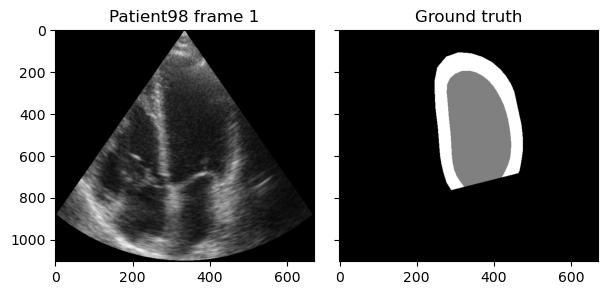

In [122]:
# Define parameters
patient = '98' # From 01 to 98
frame = 1
seq_path = 'patient0{}/patient0{}_4CH_sequence.mhd'.format(patient, patient)
seq_gt_path = 'patient0{}/patient0{}_4CH_sequence_gt.mhd'.format(patient, patient)
    
visualization(patient, frame, seq_path, seq_gt_path)

# 1. Individual frames prediction - Results

In [189]:
# Base directory
os.chdir('D:/TFG/TED/individual_pred')

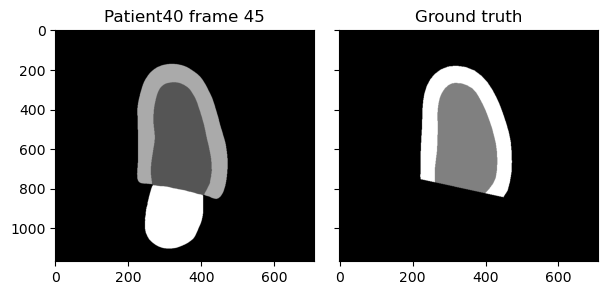

In [170]:
patient = '40' # From 01 to 98
frame = 45
seq_path = 'patient0{}_4CH.nii'.format(patient, patient)
seq_gt_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence_gt.mhd'.format(patient, patient)
    
visualization(patient, frame, seq_path, seq_gt_path)

## 1.1 Evaluation

## 1.2 Number of pixels

In [213]:
patient = '06'

# GROUND TRUTH
gt_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence_gt.mhd'.format(patient, patient)
seq_gt = io.imread(gt_path, plugin='simpleitk')

pixels_4CH_Endo_gt = []
pixels_4CH_Epi_gt = []

for i in range(0, seq_gt.shape[0]):
    pixels_4CH_Endo_gt.append(np.sum(seq_gt[i] == 1)) # 1 correspond to the LV Endo
    pixels_4CH_Epi_gt.append(np.sum(seq_gt[i] == 2)) # 2 correspond to the LV Epi

# PREDICTION
pred_path = 'D:/TFG/TED/individual_pred/patient0{}_4CH.nii'.format(patient)
seq_pred = io.imread(pred_path, plugin='simpleitk')

pixels_4CH_Endo = []
pixels_4CH_Epi = []

for i in range(0, seq_pred.shape[0]):
    pixels_4CH_Endo.append(np.sum(seq_pred[i] == 1)) # 1 correspond to the LV Endo
    pixels_4CH_Epi.append(np.sum(seq_pred[i] == 2)) # 2 correspond to the LV Epi

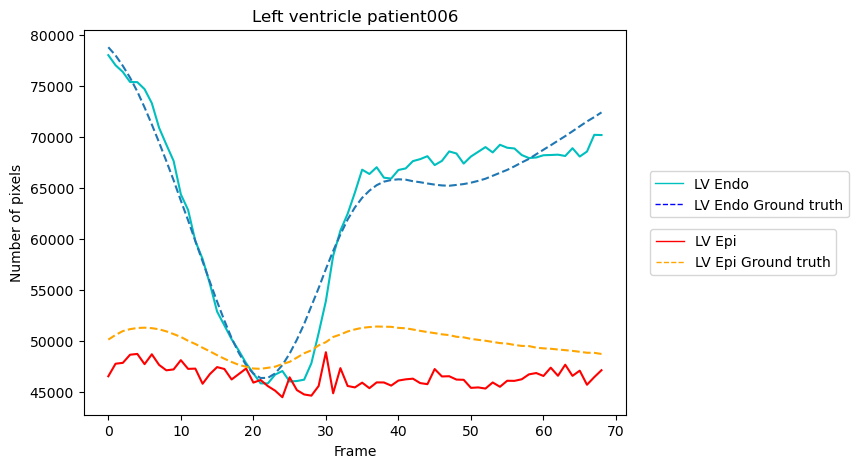

In [214]:
# Create figure
fig = plt.figure(figsize=(7, 5))
gs = fig.add_gridspec(1, 1, hspace=0.1, wspace=0.1)
ax1 = gs.subplots(sharex='col', sharey='row')
    
# LV Endocardium
ax1.plot(pixels_4CH_Endo, 'c',label = 'LV Endo')
ax1.plot(pixels_4CH_Endo_gt, linestyle='dashed', label = 'LV Endo gt')

LV_Endo = [Line2D([0], [0], color='c', lw=1, label='LV Endo'),
           Line2D([0], [0], color='blue', lw=1, label='LV Endo Ground truth', linestyle='dashed')]

# LV Epicardium
ax1.plot(pixels_4CH_Epi, 'r',label = 'LV Epi')
ax1.plot(pixels_4CH_Epi_gt, 'orange', linestyle='dashed', label = 'LV Epi gt')

LV_Epi = [Line2D([0], [0], color='r', lw=1, label='LV Epi'),
          Line2D([0], [0], color='orange', lw=1, label='LV Epi Ground truth', linestyle='dashed')]

# Legend
legend = ax1.legend(handles=LV_Endo, loc='upper right', bbox_to_anchor=(1.423, 0.65))
ax1.add_artist(legend)
ax1.legend(handles=LV_Epi, loc='upper right', bbox_to_anchor=(1.4, 0.5))

ax1.set_xlabel("Frame")
ax1.set_ylabel("Number of pixels")
ax1.set_title("Left ventricle patient0{}".format(patient))
plt.show()

## 1.3 Animation

True

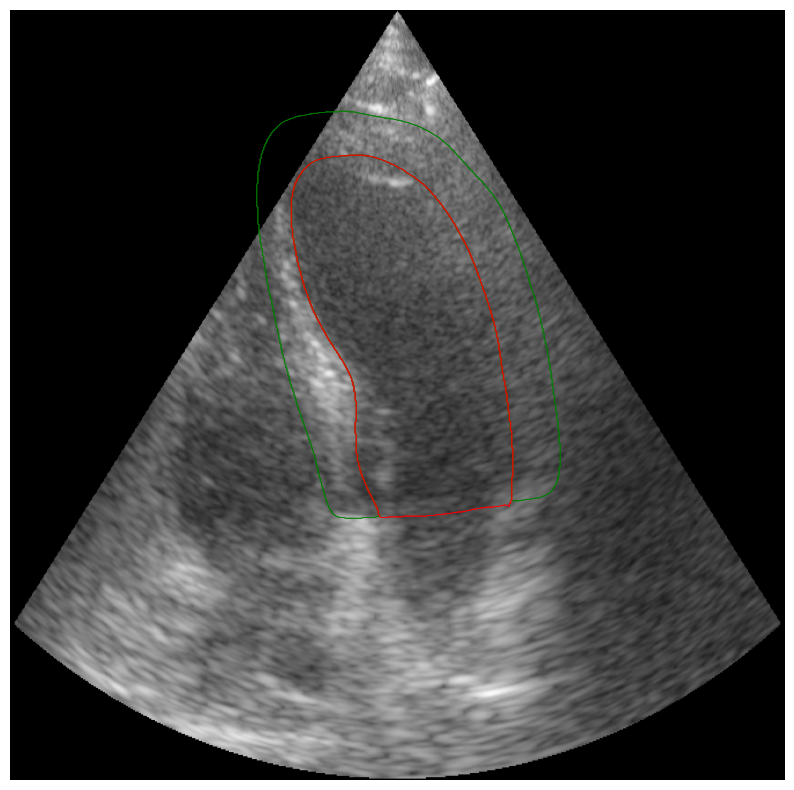

In [235]:
# Save frames
os.chdir('D:/TFG/TED/individual_pred')
patient = '07' # patient

if (os.path.exists('animation/patient0{}'.format(patient)) == False):
    os.mkdir('animation/patient0{}.'.format(patient))

seq_pred_path = 'patient0{}_4CH.nii'.format(patient, patient)
seq_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence.mhd'.format(patient, patient)

seq_pred = io.imread(seq_pred_path, plugin='simpleitk')
seq = io.imread(seq_path, plugin='simpleitk')

for i in range(0, seq.shape[0]):

    fig = plt.figure(figsize=(10, 10))
    gs = fig.add_gridspec(1, 1, hspace=0.1, wspace=0.1)
    (ax1) = gs.subplots(sharex='col', sharey='row')
    plt.axis('off')
    ax1.imshow(seq_pred[i], cmap='gray')
    ax1.axis('auto')

    ax1.imshow(seq[i], cmap='gray')
    ax1.contour(seq_pred[i]==2, colors='g', linewidths = 0.2)
    ax1.contour(seq_pred[i]==1, colors='r', linewidths = 0.2)
    ax1.axis('auto')

    for ax in fig.get_axes():
        ax.label_outer()

    fig.savefig('animation/patient0{}/frame_{}.png'.format(patient, i), bbox_inches='tight', transparent=True, pad_inches=0)

In [236]:
import imageio.v2 as imageio
import os 

# Save GIF
os.chdir('D:/TFG/TED/individual_pred/animation/patient0{}'.format(patient))
filenames = os.listdir('D:/TFG/TED/individual_pred/animation/patient0{}'.format(patient))
sorted_filenames = sorted(filenames, key=lambda x: int(re.search(r'\d+', x).group()))

with imageio.get_writer('Patient0{}.gif'.format(patient), mode='I') as writer:
    for filename in sorted_filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

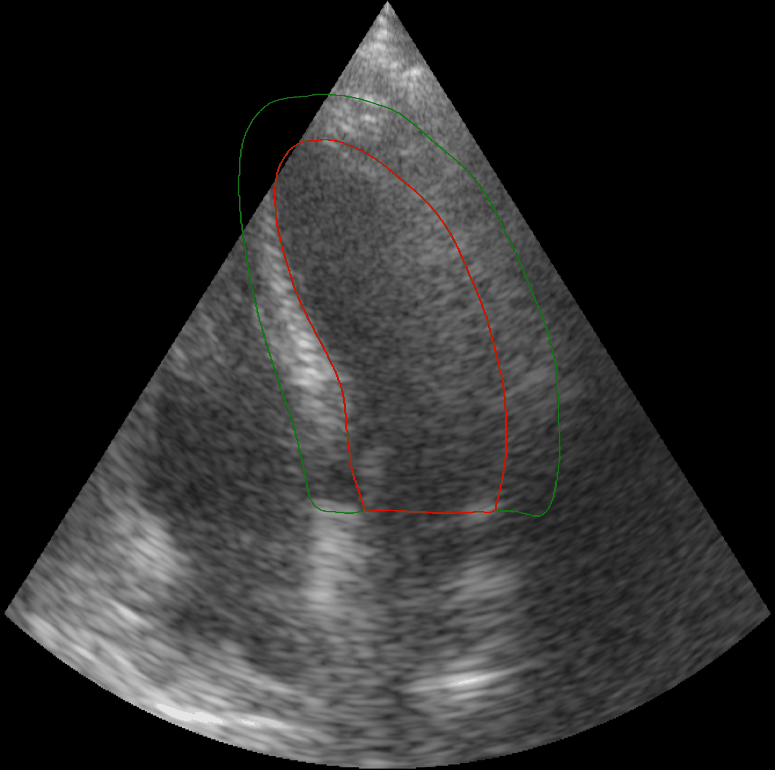

In [243]:
path = 'D:/TFG/TED/individual_pred/animation/patient0{}/Patient0{}.gif'.format(patient, patient)

from IPython.display import Image
with open(path,"rb") as f:
    display(Image(data=f.read(), format='png', width=300, height=300))

# 2. Adjacent frames prediction - Results

In [31]:
# Base directory
os.chdir('D:/TFG/TED/adjacent_pred')

## 2.1 Evaluation

## 2.2. Number of pixels

## 2.3 Animation